<center> <font size="6"> <b> Customized Resilience Inference Measurement Model </b> </font> </center>
<br>

<center><font size="3"> <b>Authors</b> : Debayan Mandal <sup>1</sup>, Dr. Lei Zou <sup>1,*</sup>, Rohan Singh Wilkho<sup>3</sup>, Joynal Abedin<sup>1</sup>, Bing Zhou<sup>1</sup>, Dr. Heng Cai<sup>2</sup> </font></center>
<br>

<font size="3"> <sup> 1 </sup> Geospatial Exploration and Resolution (GEAR) Lab, Department of Geography, College of Geosciences, Texas A &amp; M University </font> <br>
<font size="3"> <sup> 2 </sup> Department of Geography, College of Geosciences, Texas A &amp; M University </font> <br>
<font size="3"> <sup> 3 </sup> Zachry Department of Civil and Environmental Engineering, College of Engineering, Texas A &amp; M University </font> <br>
<font size="3"> <sup> * </sup> Corresponding author: lzou@tamu.edu <br>

[Geospatial Exploration and Resolution (GEAR) Lab](https://www.geoearlab.com) <br /><br />
You can checkout the paper here: 

---

# Introduction

Resilience assessment and improvement have become increasingly important in today's world, where natural and man-made disasters are becoming more frequent and severe. Cities, communities, and organizations are recognizing the need to prepare for and mitigate the impacts of disasters and disruptions, and there is a growing body of research and practice on resilience assessment and improvement.

One significant research gap in this area is the lack of a customizable platform for resilience assessment and improvement. While there are many tools and frameworks available for assessing and improving resilience, they are often limited in their scope and applicability. Many of these tools are designed for specific types of hazards or sectors and may not be easily adapted to other contexts. Furthermore, many of these tools are proprietary and require significant resources to implement and maintain.


A customizable platform for resilience assessment and improvement would address these limitations by providing a flexible and adaptable framework that can be tailored to the needs and priorities of different users. Such a platform would allow users to customize the tools and metrics used for resilience assessment, as well as the interventions and strategies for resilience improvement. This would enable users to address specific challenges and opportunities in their context, and to leverage existing resources and knowledge to support resilience. By enabling users to tailor resilience assessment and improvement to their specific needs and priorities, such a platform would help to build more resilient communities, organizations, and systems, and contribute to a more sustainable and resilient future for all.

## Resilience Inference Measurement Model

The Resilience Inference Measurement (RIM) model was developed by Dr. Nina Lam to measure disaster resilience of various units of the community, viz. individuals and organizations [9]. It is based on the idea that resilience is dependent on adaptability as well as vulnerability, i.e., not just the ability to bounce back from adversity, but also the ability to adapt and thrive in the face of ongoing challenges and stressors. The RIM model is unique in that it evaluates resilience using empirical disaster measures such as threat, damage and recovery in line with the Sendai Framework, as well as taking on a holistic approach to measuring resilience, incorporating not only empirical factors but also the broader social and environmental context. This makes it a powerful tool for identifying areas of strength and weakness in resilience and for developing targeted interventions and strategies to build resilience in communities.

<div style="text-align:center;">
    <img src="images/RIM_basic_framework.png" alt="Image" width=800 height=500 />
</div>

The above figure suggests the preliminary idea that in one resilience cycle vulnerability is dependent on exposure and damage, while adaptability is dependent upon the damage and recovery from the natural hazard. This goes into a feedback loop and updates itself in the next resilience cycle where mitigation procedures from recovery activities reduce exposure to the particular disaster while adaptation measures reduce future disaster damages. 

# Prerequisites to Model Implementation

In [1]:
import warnings
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings("ignore")

In [2]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 2.4 MB/s eta 0:00:0000:0100:01


## All the Inputs

<b>This section is only for entering filtering parameters from the whole dataset</b>

In [3]:
import preprocess as prep
widget_dict = prep.create_gui1()

In [4]:
prep.print1(widget_dict)

The inputted parameters are:
Duration to be computed:2000 to 2020 

The hazards considered in this computation are:
Avalanche, Tornado, Coastal, Flooding, SevereStorm, Wind, Drought, Heat, Earthquake, Fog, WinterWeather, Hail, Landslide, Lightning, Tsunami, Wildfire, Hurricane

All counties will be evaluated


## Data Pre-processing

In [5]:
fn = prep.process_data(widget_dict)

# Three Empirical Factor Calculation

<div style="text-align:center;">
    <img src="images/3FactorCalc.png" alt="Image" width=800 height=500 />
</div>

Above figure gives us an overview of how the RIM model quantifies resilience. Weightage for different hazards is calculated to understand the impact of each on the community based on the damage wrought per unit population. These weightages are used to divide exposure quotient for every type of disaster considered. The first empirical factor calculated here is Exposure. This is based on the frequency of the natural hazards affecting a particular community unit. Secondly, the damage factor is calculated as the total damage per capita on the county considered for the study. Lastly, the recovery variable gives a quantification of the community trying to return back to its original state before disaster.  As population change is one prominent factor for quantifying the community works despite disaster, i.e., if there has been migration to and from the community - this has been evaluated here as a Recovery factor. The increase in population has been calculated to be the recovery factor. The steps are dileneated in the following texts.

## Weight Calculation

<b>Step 1: Calculation of <u>Damage per day per capita population</u></b>

<b>Step 2: Calculation of <u>Total Damage per day per capita population</u> per Hazard type</b>

<b>Step 3: Calculation of <u>Average Damage per day per capita population</u> per Hazard type</b>

<b>Step 4: Calculation of <u>Frequency</u> of each Hazard type</b>

### Weight per Hazard Type

<b><p style="color:orange">Weightage for each hazard type = Damage per day per capita / Frequency</p></b>

## Exposure Calculation

<b><p style="color:orange">Exposure for each hazard type = Duration(days) * Weightage_Mean* Probability</p></b>

<b>Step 5: Calculation of Exposure by Hazard Event</b>

<b>Step 6: Calculation of Exposure by County</b>

## Damage Calculation

<b><p style="color:orange">Damage per capita = (Crop + Property Damage)/ Initial Population</p></b>

## Recovery Calculation

<b><p style="color:orange">Recovery per county = (Final - Initial Population)/ Initial Population</p></b>

## Normalizing Parameters

MinMax Scaling is a normalization technique that rescales numeric features into a common range, typically 0 to 1, ensuring that no particular feature dominates due to its numeric range. The calculation involves subtracting the minimum value of a feature, then dividing by its range (maximum - minimum). This technique maintains the original distribution's shape but doesn't handle outliers well. In the new scale, the minimum value becomes 0, the maximum 1, and all other values fall proportionally within this range.

In [6]:
edr_tot = prep.empfac(fn, widget_dict)

# Disaster Resilience Indexes

<div style="text-align:center;">
    <img src="images/AdapVuln.png" alt="Image" width=800 height=500 />
</div>

Finally, the two resilience indexes are calculated. Vulnerability index is considered as the susceptibility of a community to the vagaries of natural hazards. It is calculated as the difference between normalized damage and exposure. The theory holds that a community that suffers similar destruction in less frequent disasters will be considered more vulnerable than a community that experiences more frequent disasters. Adaptability index, on the other hand, is considered as the ability of the community to bounce back from the disaster to normal activity levels. It is calculated as the difference between normalized recovery and damage. This theory is self-explanatory since it quantifies how much a community has recovered from the damage it had suffered.

## Adaptability Calculation

Adaptability in disaster resilience refers to the ability of a community or system to adjust and respond effectively to changes or disruptions caused by a disaster. This includes the capacity to anticipate, absorb, and recover from the impacts of a disaster, and to learn from the experience in order to better prepare for future events.

<b>LookUp Kit for Adaptability: - </b>

<ol>
    <li>Adaptability Low</li>
    <li>Adaptability Medium</li>
    <li>Adaptability High</li>
    <li>Adaptability Extremely High</li>
</ol>

<b><p style="color:maroon">Adaptability = Normalized Recovery - Normalized Damage</p></b>

## Vulnerability Calculation

Vulnerability in disaster resilience refers to the susceptibility of a community or system to potential harm or damage caused by natural or human-made hazards. This can be influenced by various factors such as socioeconomic status, physical and environmental conditions, and access to resources and services. Reducing vulnerability is a crucial aspect of building resilience to disasters, as it enables communities to better withstand and recover from the impacts of disasters.

<b>LookUp Kit for Vulnerability: - </b>

<ol>
    <li>Vulnerability Low</li>
    <li>Vulnerability Medium</li>
    <li>Vulnerability High</li>
    <li>Vulnerability Extremely High</li>
</ol>

<b><p style="color:maroon">Vulnerability = Normalized Damage - Normalized Exposure</p></b>

## Composite Index Calculation

<b>LookUp Kit for Vulnerability: - </b>

<ol>
    <li>Vulnerability Low</li>
    <li>Vulnerability Medium</li>
    <li>Vulnerability High</li>
    <li>Vulnerability Extremely High</li>
</ol>

The authors here hold the notion that adaptability defines the resilience of a community more prominently than the vulnerability. This is so as we define a resilient community as one which can return to it's normal after being hit by a disaster. However, the authors do acknowledge that at different scenarios, this definition may not hold true. The user is encouraged to switch around the computations of the composite index to suit their needs.

In [7]:
edr_tot,prgr = prep.disres(edr_tot)

## Priori Group Visualization

<div style="text-align:center;">
    <img src="images/Viz.png" alt="Image" width=700 height=500 />
</div>

### Merging geometric dataset to results

### Making Interactive Map

In [8]:
final_df = prep.gencpleth(prgr, "data/counties/geojson-counties-fips.json", widget_dict['ini'].value, widget_dict['fin'].value)

# Socio-Economic Data Processing

## Post Groups with Customisable Machine Learning

<div style="text-align:center;">
    <img src="images/ML.png" alt="Image" width=700 height=500 />
</div>

The framework uses Machine Learning (ML) models to determine the driving factors for the vulnerability and adaptability indices. Both regressors and classifiers are provided. The numerical  resilience values are continuous values, so is given the option of training and testing regression models. The resilience classes, i.e. Adaptability, Vulnerability and Resilience Index are given the option of training and testing classifier models. 

After splitting the dataset into training and testing sets, it performs hyperparameter tuning using Grid Search CV. Hyperparameter tuning allows optimization of the performance of models. It will then choose models that yield the lowest average Root Mean Squared Error (RMSE) values or Accuracy scores in the cross validation process.

<u>Re-training tuned models</u>: Once it finds the optimized hyperparameters for each model, it initializes the model with those parameters, and re-train on the original training set.

<u>Evaluating final performance</u>: Both optimization score and feature importance is printed at the end of each ML model training.

### Variable Correlation

<b>Checking data correlation:</b>

In [ ]:
import corr as corr
X, data, corr_matrix = corr.matrix('data/variables', widget_dict['ini'].value, widget_dict['fin'].value, final_df)

In general, it is desirable to avoid using highly correlated independent variables as inputs to a machine learning model. This is because highly correlated variables can lead to overfitting, where the model fits the noise in the data instead of the underlying relationships between the independent and dependent variables. 

A commonly used rule of thumb is to avoid using variables with a correlation coefficient above 0.7 or below -0.7. However, the exact threshold for acceptable correlation depends on the specific problem and the nature of the data. It is generally a good idea to examine the pairwise correlation between the independent variables and remove highly correlated variables before fitting a machine learning model.

In [12]:
choice = corr.remopt()

Enter method for dropping columns: 


RadioButtons(description='Options:', options=('Remove by selecting names', 'Remove by correlation index'), val…

In [11]:
columns_to_drop = corr.optionA(data) if choice.value == 'Remove by selecting names' else corr.optionB(data) if choice.value == 'Remove by correlation index' else None

Enter the correlation index (0.7 is usual): 0.7


Columns being removed because of high correlation:

Living Alone
General Medical And Surgical Hospitals
Household with no plumbing
Median Household Income
Households with atleast 1 vehicle
Geographical Mobility Same House 1 Year Ago
Emergency Services Personnel


In [12]:
X = corr.dropcol(X, columns_to_drop)

In [13]:
save_df,X = corr.makedf(X, prgr)

Number of entries with no value: 14655


### Feature Scaling

<p> Why? - To have an unbiased evaluation. Otherwise Eucledian distance mire the results. If the features are on different scales, the larger ones can have a disproportionately large effect on the model, leading to biased results. By scaling the features to have zero mean and unit variance (using techniques such as StandardScaler or MinMaxScaler), we can ensure that all features have a similar impact on the model. </p>

In [14]:
X = MinMaxScaler().fit_transform(X)

### Test-train split

It divides the entire dataset into a user-inputted split. The training set is used to perform training and hyperparameter tuning, and the testing set to compare the tuned models’ performances.

In [15]:
import ML
test_split, random_state = ML.split()

FloatSlider(value=0.2, description='Test Split', max=0.9, min=0.1)

IntText(value=42, description='Random State')

Button(description='Submit', style=ButtonStyle())

In [16]:
splits = ML.split_data(X, save_df['Y_Class'], save_df['YV_Class'], save_df['YA_Class'], save_df['YV_Value'], save_df['YA_Value'], save_df['YR_Value'], test_split, random_state)

# Regressors

## Choose your model
- [Linear Regression](#Linear-Regression)
- [Ridge Regression](#Ridge-Regression)
- [Support Vector Regression](#Support-Vector-Regression)
- [Random Forest Regression](#Random-Forest-Regression)
- [XGBoost Regression](#XGBoost-Regression)
- [Bayesian Network](#Bayesian-Network)

## Linear Regression

Linear regression is a statistical method used to study the relationship between two continuous variables by fitting a linear equation to the observed data. The goal of linear regression is to find the best-fit line that can predict the value of the dependent variable (Y) based on the value of the independent variable (X).

Pros:
- Simple and easy to understand.
- Fast and computationally efficient.
- Works well when the relationship between variables is linear.

Cons:
- Assumes a linear relationship between variables, which may not always hold true.
- Sensitive to outliers, as they can significantly impact the fit of the model.
- Cannot handle non-linear relationships or interactions between variables.

### Adaptability

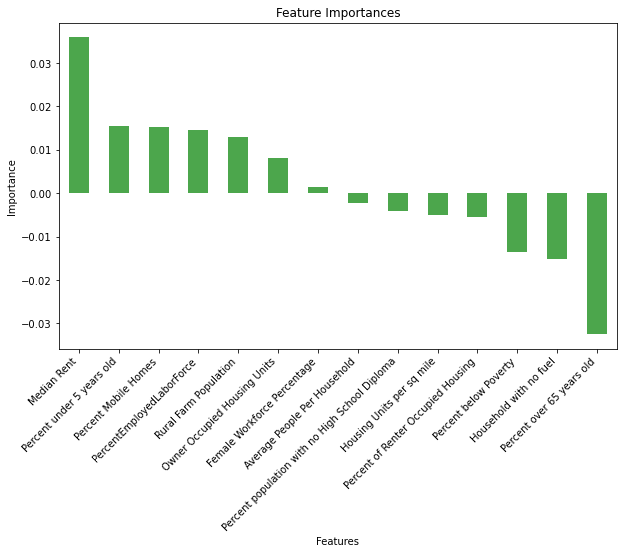

MSE: 0.00034
RMSE: 0.01846
MAE: 0.00692


In [17]:
best_model, feature_importance_df = ML.perform_linear_regression(splits, 'Xar_train', 'yar_train', 'Xar_test', 'yar_test', save_df)

#### For higher degree polynomial fitting:

Best Degree: 1
Minimum MSE: 0.00034


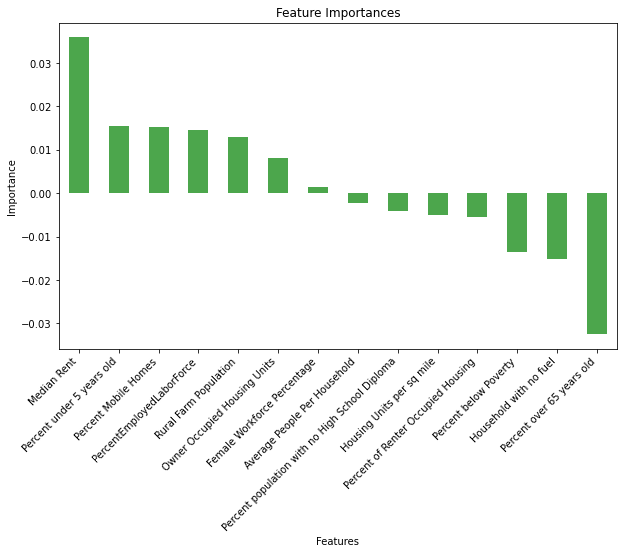

MSE: 0.00034
RMSE: 0.01846
MAE: 0.00652


In [18]:
best_model, feature_importance_df = ML.perform_poly_regression(splits, 'Xar_train', 'yar_train', 'Xar_test', 'yar_test', save_df, range(1, 3))

### Vulnerability

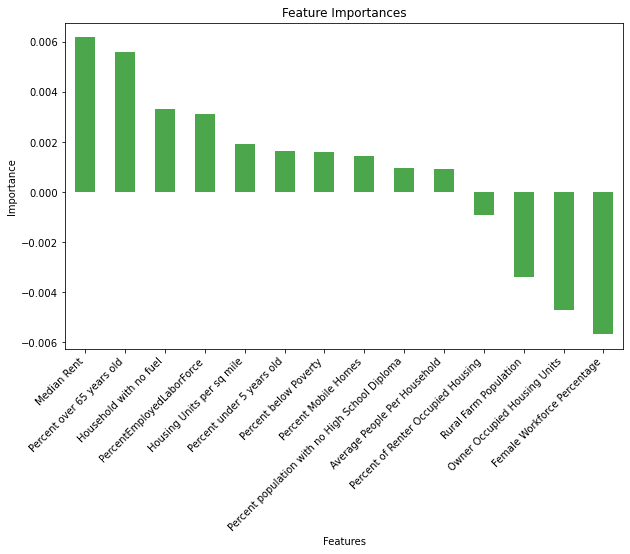

MSE: 0.00016
RMSE: 0.01252
MAE: 0.00176


In [19]:
best_model, feature_importance_df = ML.perform_linear_regression(splits, 'Xvr_train', 'yvr_train', 'Xvr_test', 'yvr_test', save_df)

#### For higher degree polynomial fitting:

Best Degree: 1
Minimum MSE: 0.00016


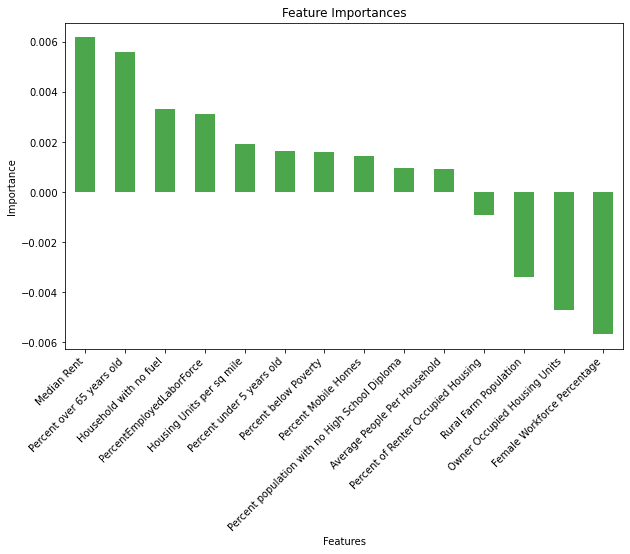

MSE: 0.00016
RMSE: 0.01252
MAE: 0.00183


In [20]:
best_model, feature_importance_df = ML.perform_poly_regression(splits, 'Xvr_train', 'yvr_train', 'Xvr_test', 'yvr_test', save_df, range(1, 3))

### Resilience

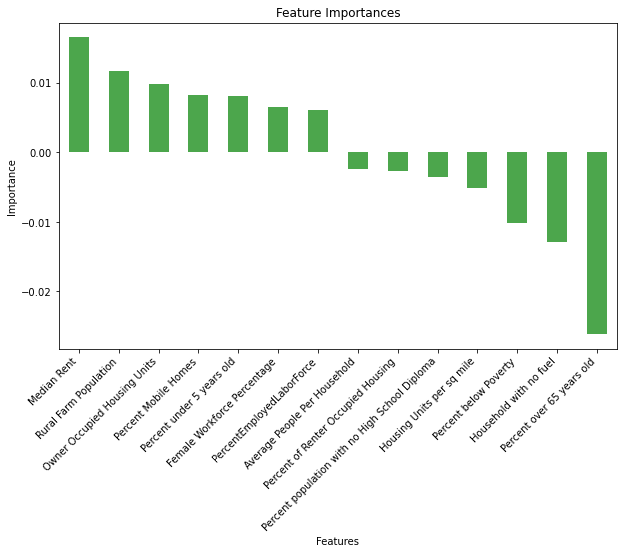

MSE: 0.00052
RMSE: 0.02278
MAE: 0.00530


In [21]:
best_model, feature_importance_df = ML.perform_linear_regression(splits, 'Xrr_train', 'yrr_train', 'Xrr_test', 'yrr_test', save_df)

#### For higher degree polynomial fitting:

Best Degree: 1
Minimum MSE: 0.00052


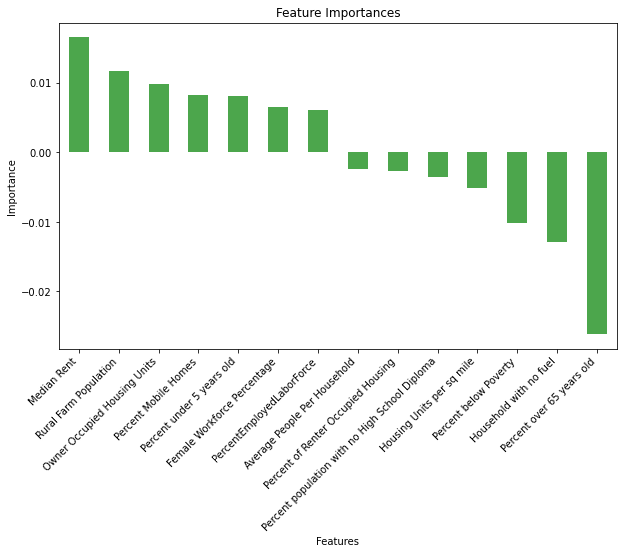

MSE: 0.00052
RMSE: 0.02278
MAE: 0.00508


In [22]:
best_model, feature_importance_df = ML.perform_poly_regression(splits, 'Xrr_train', 'yrr_train', 'Xrr_test', 'yrr_test', save_df, range(1, 3))

## Ridge Regression

Ridge regression is a linear regression algorithm used to deal with multicollinearity in data. It adds a penalty term to the sum of squared errors that forces the model to choose smaller coefficients for correlated variables. This helps to reduce the variance in the model by shrinking the regression coefficients towards zero.

Pros of Ridge Regression:
- Helps to deal with multicollinearity in the data
- Can improve the stability and generalization performance of the model
- Can prevent overfitting of the model by reducing the variance in the estimates
- Works well when the number of predictors is larger than the number of samples

Cons of Ridge Regression:
- The selection of the penalty parameter is crucial for the performance of the model
- It assumes that all predictors are relevant to the outcome, which may not always be the case
- It does not perform feature selection, meaning all variables will be retained in the model, which can lead to overfitting

### Adaptability

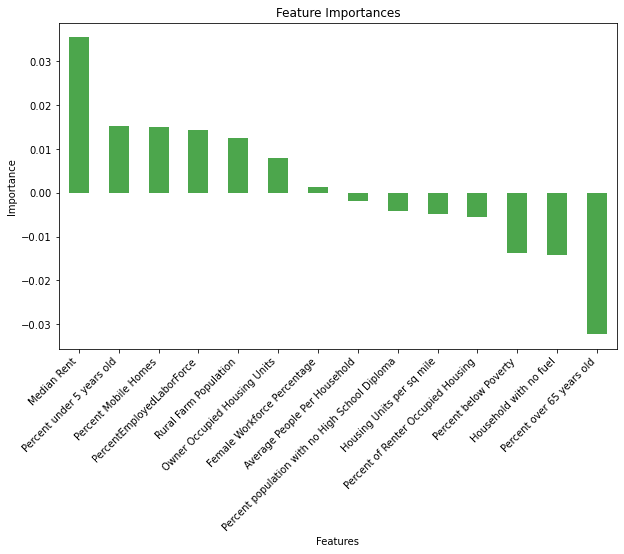

MSE: 0.00034
RMSE: 0.01846
MAE: 0.00692


In [23]:
best_model, importances = ML.perform_ridge_regression(splits, 'Xar_train', 'yar_train', 'Xar_test', 'yar_test', save_df)

### Vulnerability

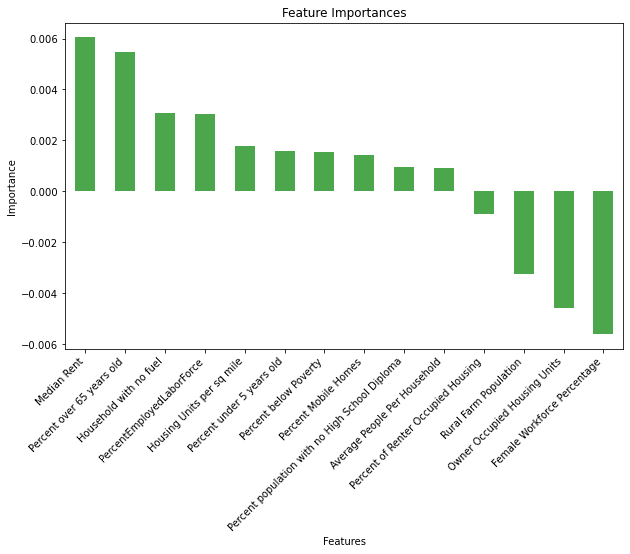

MSE: 0.00016
RMSE: 0.01252
MAE: 0.00176


In [25]:
best_model, importances = ML.perform_ridge_regression(splits, 'Xvr_train', 'yvr_train', 'Xvr_test', 'yvr_test', save_df)

### Resilience

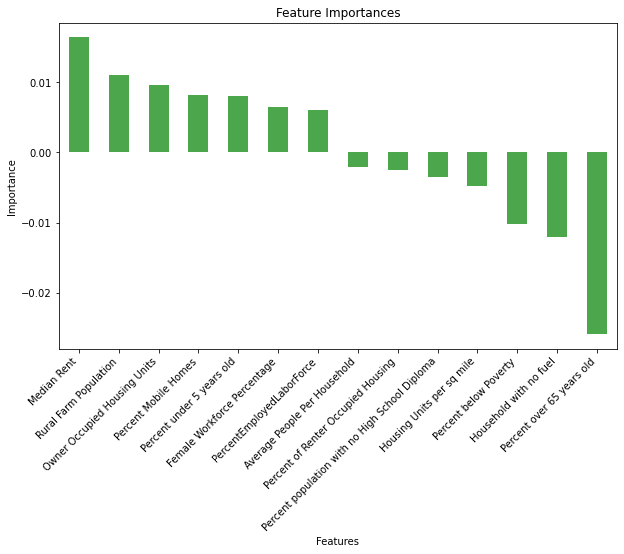

MSE: 0.00052
RMSE: 0.02278
MAE: 0.00529


In [26]:
best_model, importances = ML.perform_ridge_regression(splits, 'Xrr_train', 'yrr_train', 'Xrr_test', 'yrr_test', save_df)

## Support Vector Regression 

### Adaptability

In [ ]:
best_model, importances = ML.perform_svr(splits, 'Xar_train', 'yar_train', 'Xar_test', 'yar_test', save_df)

### Vulnerability

In [ ]:
best_model, importances = ML.perform_svr(splits, 'Xvr_train', 'yvr_train', 'Xvr_test', 'yvr_test', save_df)

### Resilience

In [ ]:
best_model, importances = ML.perform_svr(splits, 'Xrr_train', 'yrr_train', 'Xrr_test', 'yrr_test', save_df)

## Random Forest Regression

Random Forest Regression builds a number of decision trees on a randomly selected subset of the training set, and then averages the predictions of each tree to produce the final prediction. The randomness in the selection of features and samples reduces the variance and overfitting.

Pros:
- Handles high dimensional datasets well
- Can handle both categorical and continuous data
- Tends to have good predictive accuracy
- Provides a measure of feature importance

Cons:
- Can be slower than other regression algorithms due to the large number of trees
- Can be difficult to interpret the relationships between the independent and dependent variables
- May overfit the training data if the number of trees is too large

### Adaptability

MSE: 0.0003194777055431521
RMSE: 0.017873939284420548
MAE: 0.005748392591169003


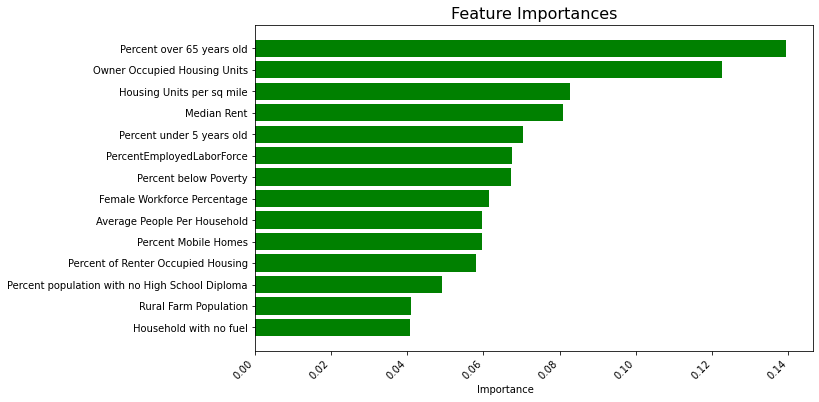

In [27]:
best_model, importances = ML.perform_random_forest(splits, 'Xar_train', 'yar_train', 'Xar_test', 'yar_test', save_df, random_state)

### Vulnerability

MSE: 0.00015487748787118143
RMSE: 0.012444978419876084
MAE: 0.0017970720583366875


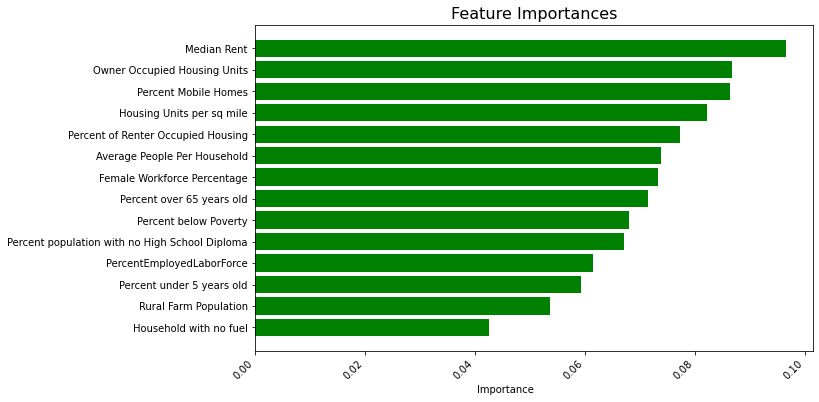

In [28]:
best_model, importances = ML.perform_random_forest(splits, 'Xvr_train', 'yvr_train', 'Xvr_test', 'yvr_test', save_df, random_state)

### Resilience

MSE: 0.0005067027843961834
RMSE: 0.02251005962666877
MAE: 0.004664485230912826


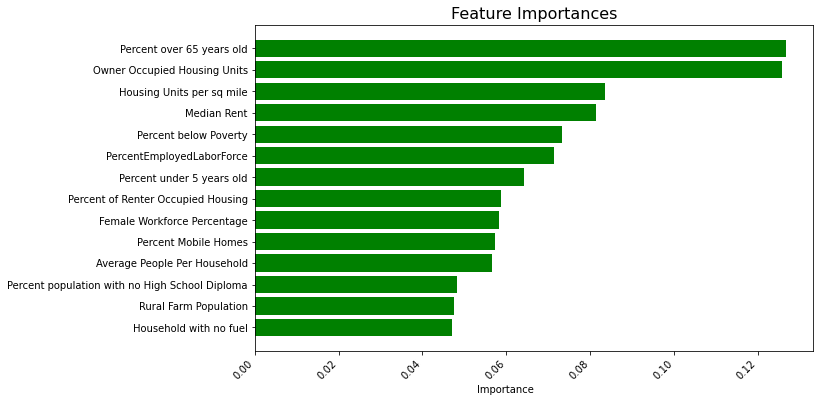

In [29]:
best_model, importances = ML.perform_random_forest(splits, 'Xrr_train', 'yrr_train', 'Xrr_test', 'yrr_test', save_df, random_state)

## XGBoost Regression

XGBoost Regression is a type of regression algorithm that uses an ensemble of decision trees to make predictions. It is an extension of the gradient boosting algorithm, and is known for its high predictive power and speed.

Pros:
- High accuracy: XGBoost Regression is known for its high accuracy and predictive power, making it a popular choice for regression tasks.
- Speed: XGBoost Regression is optimized for performance, and can handle large datasets with ease.
- Handles missing data: XGBoost Regression can handle missing data by using regularization techniques.
- Feature importance: XGBoost Regression provides a feature importance score, which can help identify the most important variables in the dataset.

Cons:
- Overfitting: XGBoost Regression can be prone to overfitting if the hyperparameters are not tuned correctly.
- Complexity: XGBoost Regression can be more complex to implement and tune than simpler regression algorithms.
- Black box: Like other ensemble methods, XGBoost Regression can be difficult to interpret due to its black box nature.

### Adaptability

Best Hyperparameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
Best Score:  0.09494489014441429
MSE:  0.0003462213123051894
RMSE:  0.018607023198383706
MAE:  0.006588977759415793


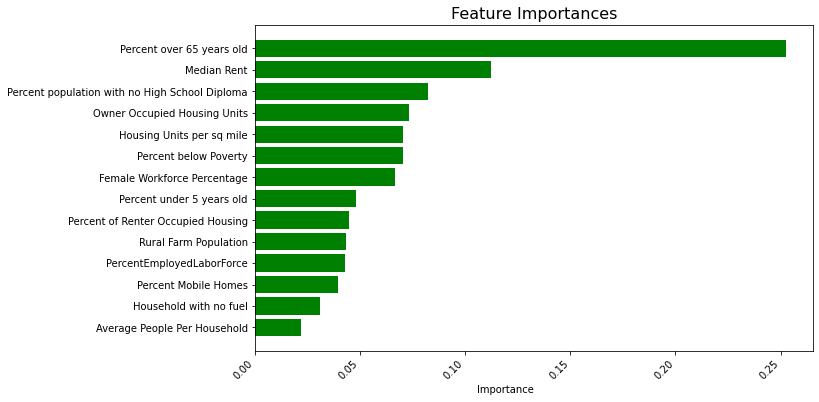

In [17]:
best_model, importances = ML.perform_xgb(splits, 'Xar_train', 'yar_train', 'Xar_test', 'yar_test', save_df)

### Vulnerability

Best Hyperparameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
Best Score:  -0.007505404724284492
MSE:  0.00015647401922662125
RMSE:  0.012508957559549927
MAE:  0.0018266236999769138


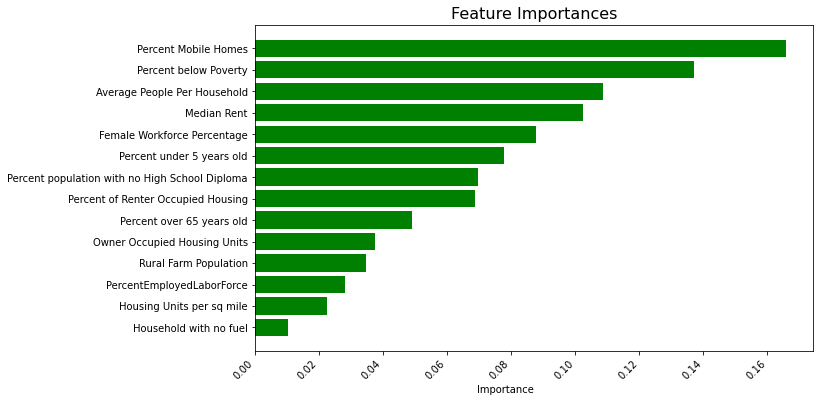

In [18]:
best_model, importances = ML.perform_xgb(splits, 'Xvr_train', 'yvr_train', 'Xvr_test', 'yvr_test', save_df)

### Resilience

Best Hyperparameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
Best Score:  0.03840034540762678
MSE:  0.0005269009145049552
RMSE:  0.02295432234906871
MAE:  0.005105155131561021


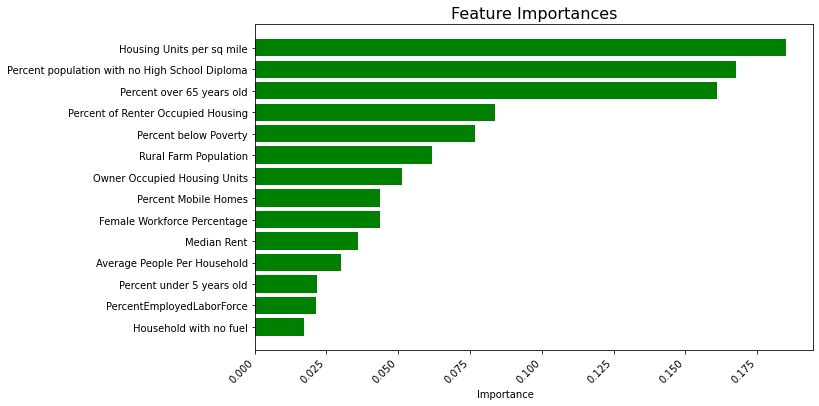

In [19]:
best_model, importances = ML.perform_xgb(splits, 'Xrr_train', 'yrr_train', 'Xrr_test', 'yrr_test', save_df)

## Bayesian Network

### Adaptability

In [20]:
inputcd = save_df.drop(["Y_Class", "YA_Class", "YV_Class", "YR_Value", "YV_Value", "FIPSstate", "uniqueID"], axis=1)
inputcd.rename(columns={"YR_Value": "Score"}, inplace=True)
inputcd.to_excel("bnlearn/Input_Data.xlsx", index=False)

Using CyberGIS-Compute HPC

In [1]:
from cybergis_compute_client import CyberGISCompute

In [2]:
cybergis = CyberGISCompute(url='cgjobsup.cigi.illinois.edu', isJupyter=True, protocol='HTTPS', port=443, suffix='v2')

<ol>
    <li> From the <b>"Job Template”</b> dropdown, select your model <b>“Customized_Resilience_Inference_Measurement_Framework”</b>
    <li> Configure your parameters and input file
    <li> Submit job
    <li> After job is finished, download the results from "/"   
</ol>

In [3]:
cybergis.show_ui()

📃 Found "cybergis_compute_user.json! NOTE: if you want to login as another user, please remove this file
🎯 Logged in as rohan_debayan@cybergisx.cigi.illinois.edu


For specific use cases please run the code through the respective HPC. It will be a time intensive process depending on the choice of parameters. The results will be downloadable as comma seperated values files. At folder to download select "/". In our analysis, for incorporating all the disasters in all the counties, the resultant directed arcs for adaptability are:

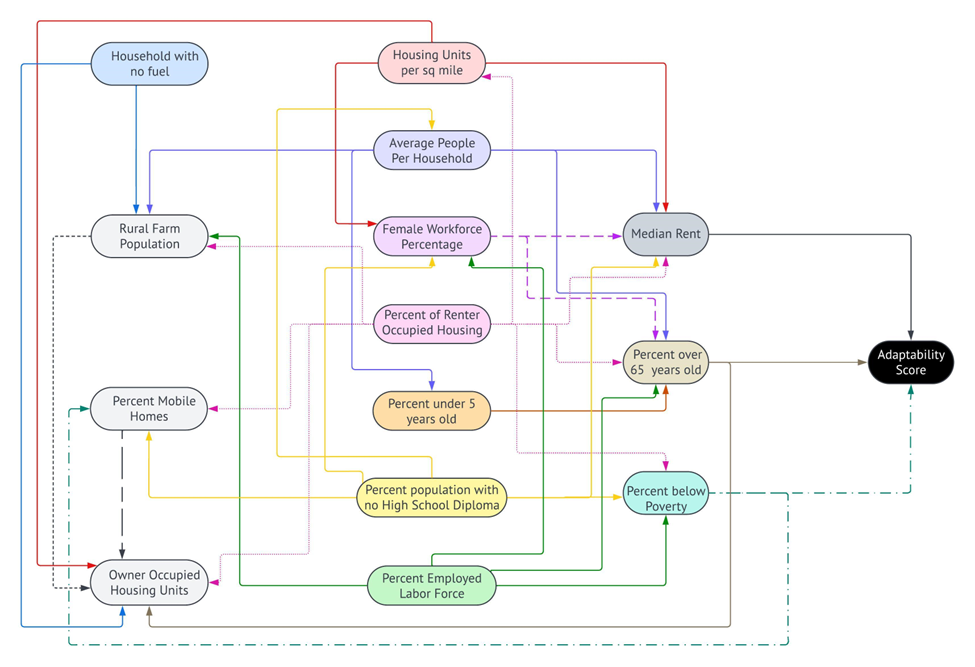

### Vulnerability

In [20]:
inputcd = save_df.drop(["Y_Class", "YA_Class", "YV_Class", "YR_Value", "YA_Value", "FIPSstate", "uniqueID"], axis=1)
inputcd.rename(columns={"YA_Value": "Score"}, inplace=True)
inputcd.to_excel("bnlearn/Input_Data.xlsx", index=False)

Using CyberGIS-Compute HPC

In [4]:
from cybergis_compute_client import CyberGISCompute

In [5]:
cybergis = CyberGISCompute(url='cgjobsup.cigi.illinois.edu', isJupyter=True, protocol='HTTPS', port=443, suffix='v2')

<ol>
    <li> From the <b>"Job Template”</b> dropdown, select your model <b>“Customized_Resilience_Inference_Measurement_Framework”</b>
    <li> Configure your parameters and input file
    <li> Submit job
</ol>

In [7]:
cybergis.show_ui()

🎯 Logged in as rohan_debayan@cybergisx.cigi.illinois.edu


For specific use cases  please run the code through the respective HPC. It will be a time intensive process depending on the choice of parameters. The results will be downloadable as comma seperated values files. In our analysis, for incorporating all the disasters in all the counties, the resultant directed arcs for vulnerability are:

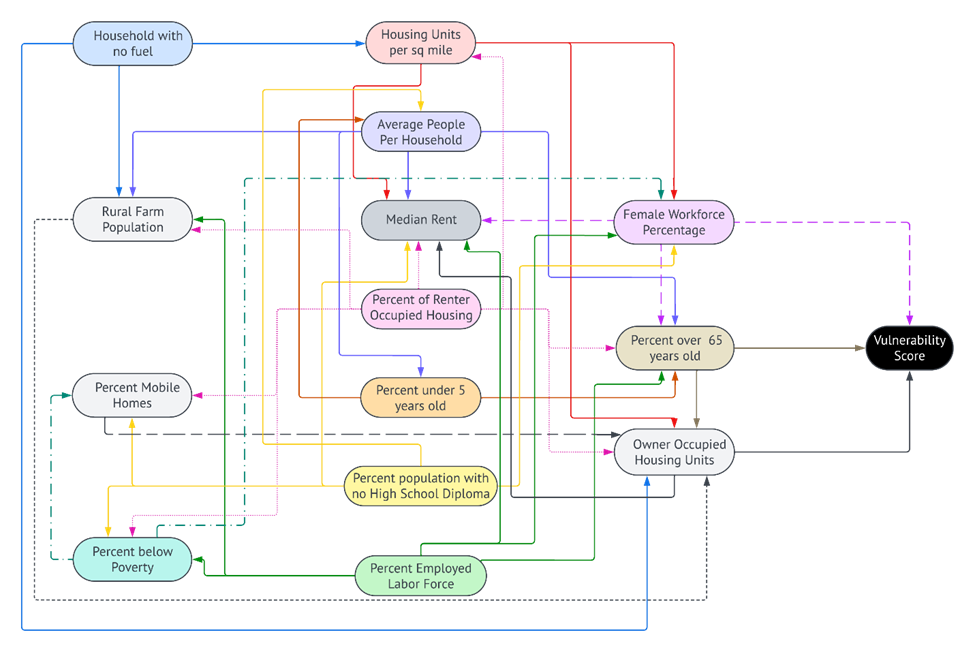

### Resilience

In [20]:
inputcd = save_df.drop(["Y_Class", "YA_Class", "YV_Class", "YV_Value", "YA_Value", "FIPSstate", "uniqueID"], axis=1)
inputcd.rename(columns={"YA_Value": "Score"}, inplace=True)
inputcd.to_excel("bnlearn/Input_Data.xlsx", index=False)

Using CyberGIS-Compute HPC

In [2]:
from cybergis_compute_client import CyberGISCompute

In [3]:
cybergis = CyberGISCompute(url='cgjobsup.cigi.illinois.edu', isJupyter=True, protocol='HTTPS', port=443, suffix='v2')

<ol>
    <li> From the <b>"Job Template”</b> dropdown, select your model <b>“Customized_Resilience_Inference_Measurement_Framework”</b>
    <li> Configure your parameters and input file
    <li> Submit job
</ol>

In [4]:
cybergis.show_ui()

📃 Found "cybergis_compute_user.json! NOTE: if you want to login as another user, please remove this file
🎯 Logged in as rohan_debayan@cybergisx.cigi.illinois.edu


For specific use cases  please run the code through the respective HPC. It will be a time intensive process depending on the choice of parameters. The results will be downloadable as comma seperated values files. In our analysis, for incorporating all the disasters in all the counties, the resultant directed arcs for overall resilience are:

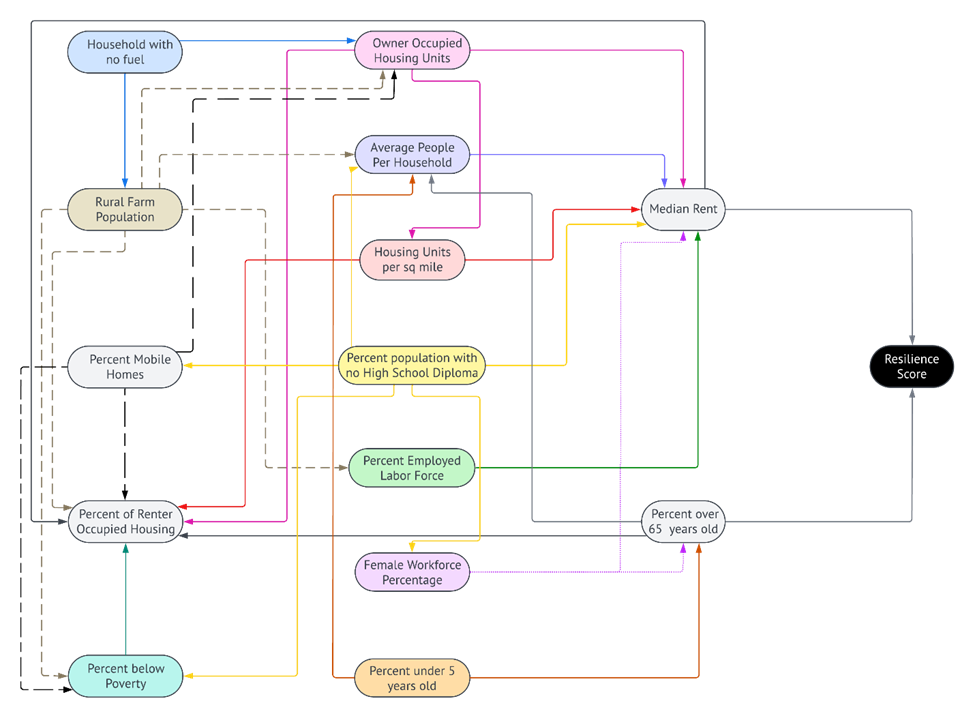

This is the tool module for usage purposes. Please check out our inferences from this result in our paper: XXXX

---